## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## First, I'll compute the camera calibration using chessboard images and apply distortion correction

In [1]:
import matplotlib.image as mping
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from PIL import Image

In [41]:
%matplotlib inline
def calibrate():
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')
    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)

            #Get Calibration Coefficients
            ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
            #Undistort the image
            dst = cv2.undistort(img, mtx, dist, None, mtx)
            #plt.imshow(dst)
            
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
            f.tight_layout()
            ax1.imshow(img)
            ax1.set_title('Original Image', fontsize=50)
            ax2.imshow(dst)
            ax2.set_title('Undistorted Image', fontsize=50)
            plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
            #plt.savefig('../output_images/undistorted_img/' + fname[22:])
            cv2.imwrite('/output_images/undistorted_img/1.jpg'  ,dst)    
            
    return mtx, dist

## Use color transforms, gradients, etc., to create a thresholded binary image.

In [3]:
def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    #binary_output = np.copy(img) # placeholder line
    return binary_output

def abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=255):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return sxbinary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(20, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(20, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary =  np.zeros_like(absgraddir)
    dir_binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return dir_binary

def bin_threshhold(image,ksize):
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=255)
    grady = abs_sobel_thresh(image, orient='y', thresh_min=20, thresh_max=255)
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(20, 255))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(20, np.pi/2))
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

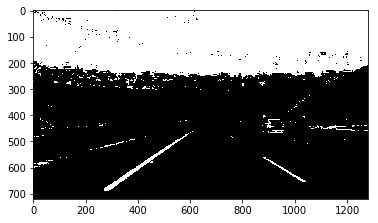

In [69]:

img = plt.imread('./test_images/test3.jpg')

hls = hls_select(img, thresh=(100, 255))

#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(img)
#ax1.set_title('Original Image', fontsize=50)
#ax2.imshow(hls, cmap='gray')
#ax2.set_title('HLS', fontsize=50)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.imshow(hls,cmap='gray')
plt.imsave('./output_images/test3.jpg', hls, cmap = 'gray')
#img = plt.imread('../test_images/test3.jpg')

#ksize = 3
#gradx = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=255)
#plt.imshow(gradx, cmap='gray')
#mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 255))
#plt.imshow(mag_binary,cmap='gray')
#combined = bin_threshhold(img,ksize)
#plt.imshow(combined,cmap='gray')
#hls = hls_select(img, thresh=(80, 255))

#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(img)
#ax1.set_title('Original Image', fontsize=50)
#ax2.imshow(hls, cmap='gray')
#ax2.set_title('HLS', fontsize=50)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Perspective Transform

In [100]:
def perspective(binary_output):
    #plt.imshow(img, cmap='gray')
    #plt.plot(290, 680, '.') #bottom left
    #plt.plot(590, 450, '.') #top left
    #plt.plot(735, 450, '.') #top right
    #plt.plot(1110, 680, '.') #bottom right
    offset = 250
    img_size = (binary_output.shape[1], binary_output.shape[0])
    src = np.float32([
            (200, 700),
            (500, 450),
            (900, 450),
            (1110,  680)])

    dst = np.float32([
            (offset, binary_output.shape[0] - offset),
            (offset, 0),
            (binary_output.shape[1] - offset, 0),
            (binary_output.shape[1] - offset, binary_output.shape[0] - offset)])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(binary_output, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv

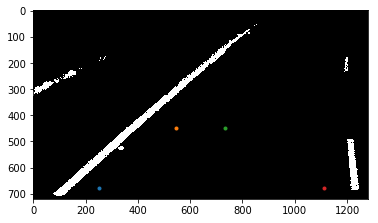

In [105]:
def perspective_test(binary_output):
    #plt.imshow(img, cmap='gray')
    plt.plot(250, 680, '.') #bottom left
    plt.plot(545, 450, '.') #top left
    plt.plot(735, 450, '.') #top right
    plt.plot(1110, 680, '.') #bottom right
    offset = 0
    img_size = (binary_output.shape[1], binary_output.shape[0])
    src = np.float32([
            (200, 700),
            (350, 450),
            (735, 450),
            (1110,  680)])

    dst = np.float32([
            (offset, binary_output.shape[0] - offset),
            (offset, 0),
            (binary_output.shape[1] - offset, 0),
            (binary_output.shape[1] - offset, binary_output.shape[0] - offset)])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(binary_output, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv
warped, Minv = perspective_test(hls)
plt.imshow(warped,cmap = 'gray')
plt.imsave('./output_images/perspective.jpg', warped, cmap = 'gray')

## Detect lane pixels and fit to find the lane boundary.

In [72]:
#Histogram
def hist(img):
    # TO-DO: Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # TO-DO: Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

In [73]:
#histogram = hist(warped)

# Visualize the resulting histogram
#plt.plot(histogram)

In [93]:
#Sliding Window
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    #plt.imshow(out_img)
    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    global prev_left_fit
    global prev_right_fit
    global left_fit
    global right_fit
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    prev_left_fit = left_fit
    prev_right_fit = right_fit
    print("once")
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    return left_fitx, right_fitx, ploty


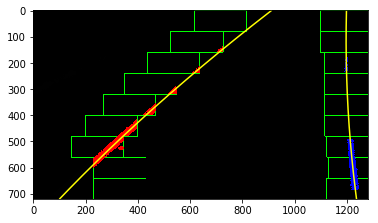

In [107]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        ### (`right` or `leftx_current`) on their mean position ###
        pass # Remove this when you add your function

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img


out_img = fit_polynomial(warped)

plt.imshow(out_img)


In [11]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    global left_fit
    global right_fit
    global prev_left_fit
    global prev_right_fit
    left_fit = np.polyfit(lefty, leftx, 2)
    if(righty.size > 0):
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        right_fit = prev_right_fit

    print("history")
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def previous(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    global prev_left_fit
    global prev_right_fit
    margin = 100
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (prev_left_fit[0]*(nonzeroy**2) + prev_left_fit[1]*nonzeroy + 
                    prev_left_fit[2] - margin)) & (nonzerox < (prev_left_fit[0]*(nonzeroy**2) + 
                    prev_left_fit[1]*nonzeroy + prev_left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (prev_right_fit[0]*(nonzeroy**2) + prev_right_fit[1]*nonzeroy + 
                    prev_right_fit[2] - margin)) & (nonzerox < (prev_right_fit[0]*(nonzeroy**2) + 
                    prev_right_fit[1]*nonzeroy + prev_right_fit[2] + margin)))
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit new polynomials
    
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    #out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    #window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    #out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    #out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    #left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    #left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
    #                          ploty])))])
    #left_line_pts = np.hstack((left_line_window1, left_line_window2))
    #right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    #right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
    #                          ploty])))])
    #right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    #cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    #cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    #result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='red')
    #plt.plot(right_fitx, ploty, color='blue')
    ## End visualization steps ##
    
    #plt.imshow(result)

    return left_fitx, right_fitx, ploty


In [12]:
#out_img = previous(warped)

#plt.imshow(out_img)

#### Determine the curvature of the lane and vehicle position with respect to center.

In [13]:
def measure_curvature_real(img):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/1200 # meters per pixel in x dimension
    
    left_fit_cr, right_fit_cr, ploty = fit_polynomial(img)
    #left_fit_cr, right_fit_cr, ploty = previous(img)
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fit_cr*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fit_cr*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad


In [14]:
#left_curverad, right_curverad = measure_curvature_real(warped)
#print(left_curverad, right_curverad)

## Project onto road


In [15]:
#img = plt.imread('../test_images/test3.jpg')

def shade_road(img, warped, Minv, left_fitx, right_fitx, ploty):

    warp_zero = np.zeros_like(warped).astype(np.uint8)

    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))


    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    return result
#plt.imshow(result)

## Pipeline for video

In [16]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

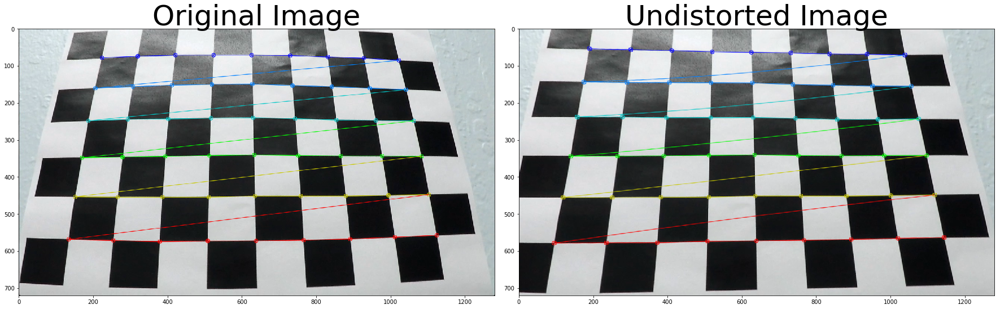

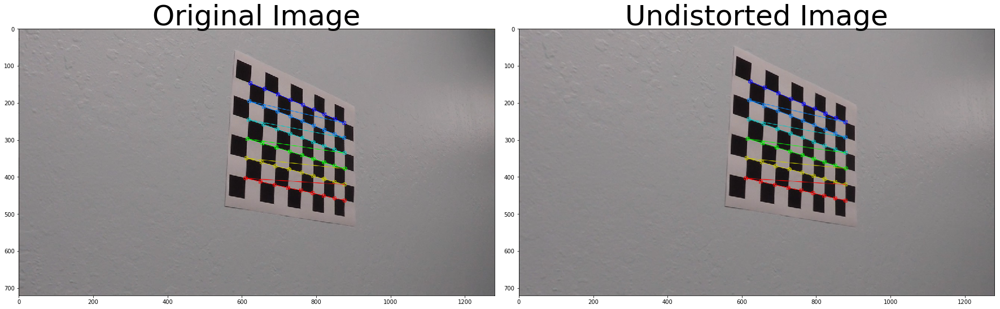

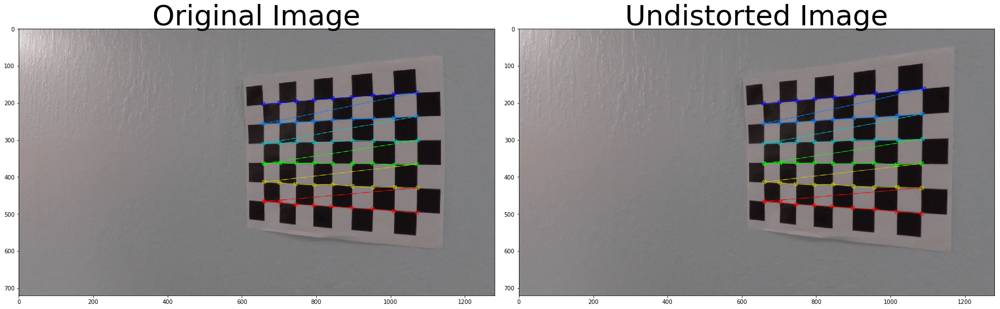

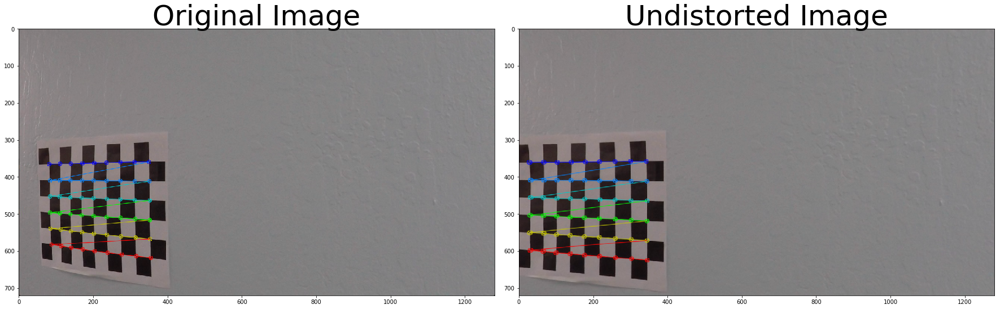

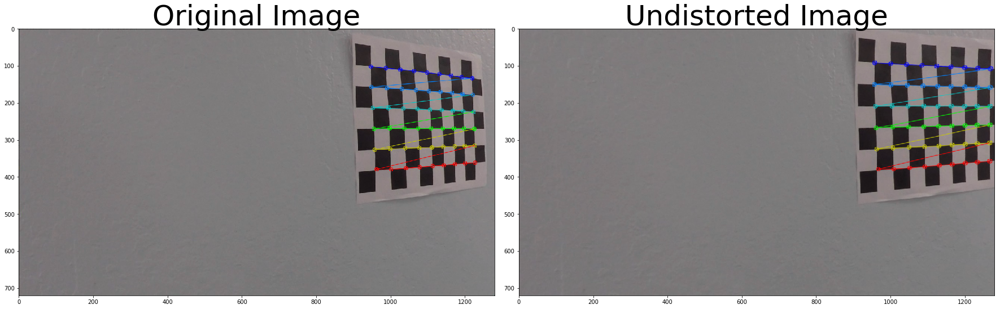

...

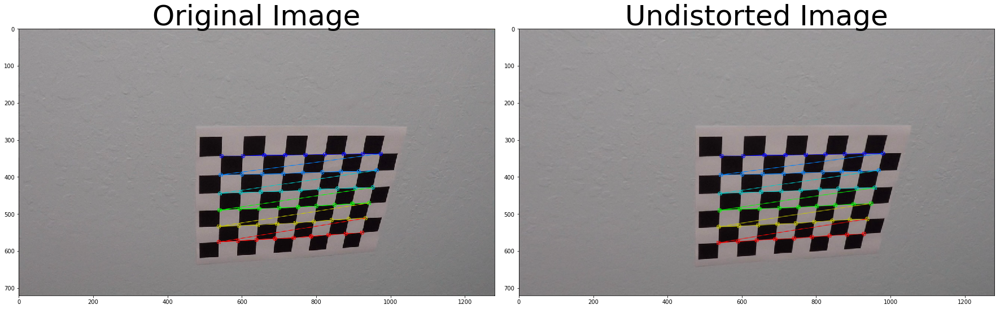

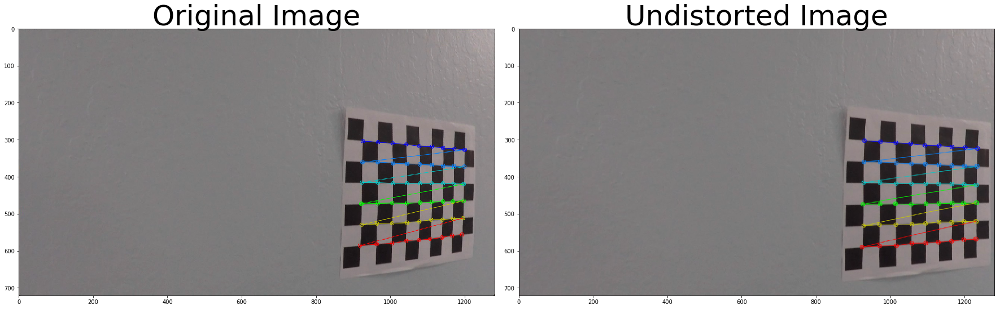

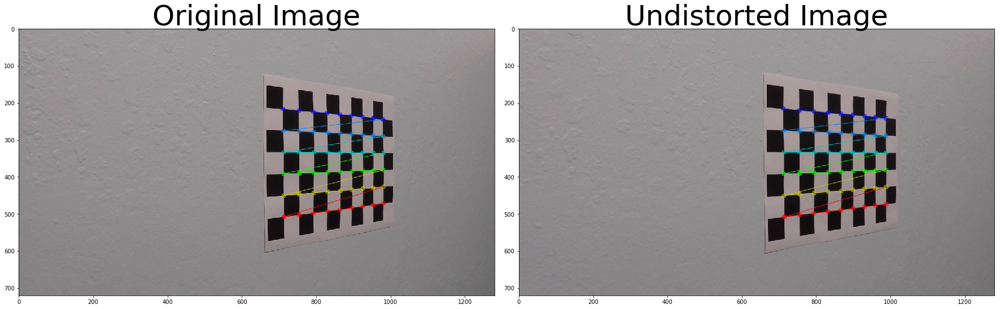

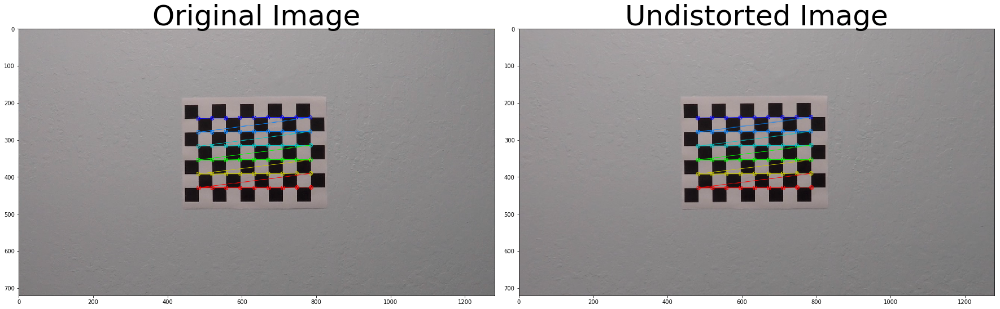

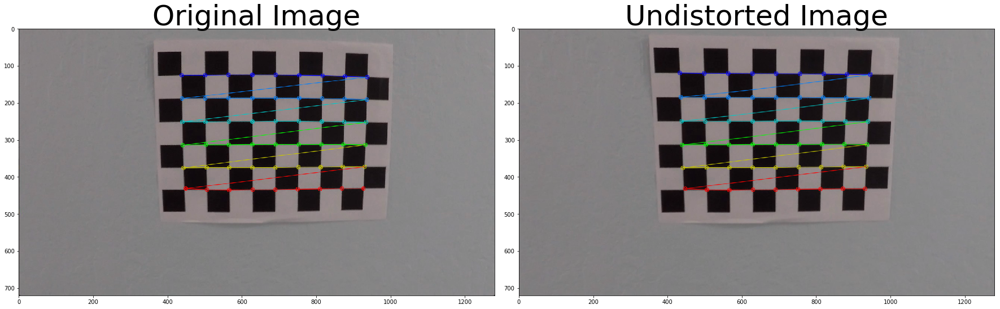

In [42]:
#1 Calibrate the camera using chessboards
mtx, dist = calibrate()

In [18]:
count = 0

def process_image(img):

    global prev_right_fit
    global prev_left_fit
    global left_fit_hist
    global right_fit_hist
    
    global count
    #2 undistort the image 
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    #3 Use HLS to create threshold binary hls
    binary_output = hls_select(undist, thresh=(100, 255))

    #4 Perform perspective transform
    warped, Minv = perspective(binary_output)
    #5 Find lines
    #If no history exists, then do this
    if(count <= 5):

        left_fitx, right_fitx, ploty = fit_polynomial(warped)
        
        left_fit_hist = np.array([left_fit])
        right_fit_hist = np.array([right_fit])

    else:
        prev_left_fit = [np.mean(left_fit_hist[:,0]), np.mean(left_fit_hist[:,1]), np.mean(left_fit_hist[:,2])]
        prev_right_fit = [np.mean(right_fit_hist[:,0]), np.mean(right_fit_hist[:,1]), np.mean(right_fit_hist[:,2])]
        left_fitx, right_fitx, ploty = previous(warped)
        
        left_fit_hist = np.vstack([left_fit_hist,left_fit])
        right_fit_hist = np.vstack([right_fit_hist,right_fit])
        
        #if(np.array_equal(left_fitx, right_fitx) == True):
        #    left_fitx, right_fitx, ploty = fit_polynomial(warped)
        
    count = count + 1 

    # Measurements
    left_curverad, right_curverad = measure_curvature_real(warped)
    result = shade_road(img, warped, Minv, left_fitx, right_fitx, ploty)
    #plt.imshow(result)
    cv2.putText(result, "left curvature: "+str(left_curverad), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(result, str(right_curverad), (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)

    return result

In [19]:
clip_out = 'output_images/clip.mp4'
clip1 = VideoFileClip("project_video.mp4")
clip_process = clip1.fl_image(process_image) 
%time clip_process.write_videofile(clip_out, audio=False)

once
once
[MoviePy] >>>> Building video output_images/clip.mp4
[MoviePy] Writing video output_images/clip.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

once
once


  0%|          | 2/1261 [00:00<04:30,  4.66it/s]

once
once


  0%|          | 3/1261 [00:00<04:32,  4.62it/s]

once
once
once

  0%|          | 4/1261 [00:00<04:26,  4.72it/s]


once


  0%|          | 5/1261 [00:01<04:28,  4.68it/s]

once
once
history


  0%|          | 6/1261 [00:01<04:23,  4.77it/s]

once
history
once


  1%|          | 8/1261 [00:01<04:17,  4.87it/s]

history
once
history


  1%|          | 9/1261 [00:01<04:13,  4.95it/s]

once
history
once


  1%|          | 11/1261 [00:02<04:01,  5.17it/s]

history
once
history


  1%|          | 12/1261 [00:02<04:12,  4.95it/s]

once
history
once

  1%|          | 13/1261 [00:02<04:15,  4.88it/s]


history
once


  1%|          | 15/1261 [00:03<04:13,  4.91it/s]

history
once
history

  1%|▏         | 16/1261 [00:03<04:16,  4.86it/s]


once
history


  1%|▏         | 18/1261 [00:03<03:25,  6.04it/s]

once
history
once


  2%|▏         | 19/1261 [00:03<03:38,  5.69it/s]

history
once
history


  2%|▏         | 20/1261 [00:03<03:48,  5.42it/s]

once
history


  2%|▏         | 21/1261 [00:04<03:58,  5.19it/s]

once
history
once


  2%|▏         | 23/1261 [00:04<04:02,  5.10it/s]

history
once
history


  2%|▏         | 24/1261 [00:04<04:05,  5.04it/s]

once
history
once


  2%|▏         | 26/1261 [00:05<04:04,  5.06it/s]

history
once
history


  2%|▏         | 27/1261 [00:05<04:06,  5.01it/s]

once
history
once


  2%|▏         | 29/1261 [00:05<04:01,  5.09it/s]

history
once


  2%|▏         | 30/1261 [00:05<04:09,  4.93it/s]

history
once
history


  3%|▎         | 32/1261 [00:06<03:30,  5.84it/s]

once
history
once


  3%|▎         | 33/1261 [00:06<03:10,  6.46it/s]

history
once
history
once


  3%|▎         | 35/1261 [00:06<03:38,  5.60it/s]

history
once


  3%|▎         | 36/1261 [00:07<03:51,  5.30it/s]

history
once
history

  3%|▎         | 37/1261 [00:07<03:57,  5.15it/s]


once
history

  3%|▎         | 38/1261 [00:07<04:01,  5.06it/s]


once


  3%|▎         | 39/1261 [00:07<04:03,  5.01it/s]

history
once
history


  3%|▎         | 40/1261 [00:07<04:05,  4.98it/s]

once
history
once


  3%|▎         | 42/1261 [00:08<04:03,  5.00it/s]

history
once
history
once


  3%|▎         | 43/1261 [00:08<07:17,  2.79it/s]

history
once


  3%|▎         | 44/1261 [00:09<07:54,  2.56it/s]

history
once


  4%|▎         | 46/1261 [00:10<09:08,  2.22it/s]

history
once


  4%|▎         | 47/1261 [00:10<08:19,  2.43it/s]

history
once


  4%|▍         | 48/1261 [00:11<08:06,  2.49it/s]

history
once


  4%|▍         | 49/1261 [00:11<07:31,  2.68it/s]

history
once


  4%|▍         | 50/1261 [00:11<07:35,  2.66it/s]

history
once


  4%|▍         | 51/1261 [00:12<07:38,  2.64it/s]

history
once


  4%|▍         | 52/1261 [00:12<07:40,  2.63it/s]

history
once


  4%|▍         | 53/1261 [00:12<07:18,  2.76it/s]

history
once


  4%|▍         | 54/1261 [00:13<07:27,  2.70it/s]

history
once


  4%|▍         | 55/1261 [00:13<07:09,  2.80it/s]

history
once


  4%|▍         | 56/1261 [00:14<07:24,  2.71it/s]

history
once


  5%|▍         | 57/1261 [00:14<07:11,  2.79it/s]

history
once


  5%|▍         | 58/1261 [00:14<07:24,  2.70it/s]

history
once


  5%|▍         | 59/1261 [00:15<07:06,  2.82it/s]

history
once


  5%|▍         | 60/1261 [00:15<07:14,  2.76it/s]

history
once


  5%|▍         | 61/1261 [00:15<06:35,  3.04it/s]

history
once


  5%|▍         | 62/1261 [00:16<06:57,  2.87it/s]

history
once


  5%|▍         | 63/1261 [00:16<06:48,  2.93it/s]

history
once


  5%|▌         | 64/1261 [00:16<07:07,  2.80it/s]

history
once


  5%|▌         | 65/1261 [00:17<07:04,  2.82it/s]

history
once


  5%|▌         | 66/1261 [00:17<07:24,  2.69it/s]

history
once
history
once


  5%|▌         | 68/1261 [00:18<08:19,  2.39it/s]

history
once


  5%|▌         | 69/1261 [00:18<08:01,  2.48it/s]

history
once


  6%|▌         | 70/1261 [00:19<07:57,  2.49it/s]

history
once


  6%|▌         | 71/1261 [00:19<07:27,  2.66it/s]

history
once


  6%|▌         | 72/1261 [00:20<07:16,  2.72it/s]

history
once


  6%|▌         | 73/1261 [00:20<07:30,  2.64it/s]

history
once


  6%|▌         | 74/1261 [00:20<07:44,  2.55it/s]

history
once


  6%|▌         | 75/1261 [00:21<07:39,  2.58it/s]

history
once


  6%|▌         | 76/1261 [00:21<07:43,  2.56it/s]

history
once


  6%|▌         | 77/1261 [00:21<07:16,  2.71it/s]

history
once


  6%|▌         | 78/1261 [00:22<07:26,  2.65it/s]

history
once


  6%|▋         | 79/1261 [00:22<07:06,  2.77it/s]

history
once


  6%|▋         | 80/1261 [00:23<07:11,  2.74it/s]

history
once


  6%|▋         | 81/1261 [00:23<07:18,  2.69it/s]

history
once


  7%|▋         | 82/1261 [00:23<06:58,  2.82it/s]

history
once


  7%|▋         | 83/1261 [00:24<07:06,  2.76it/s]

history
once


  7%|▋         | 84/1261 [00:24<06:47,  2.89it/s]

history
once


  7%|▋         | 85/1261 [00:24<07:00,  2.80it/s]

history
once


  7%|▋         | 86/1261 [00:25<06:47,  2.88it/s]

history
once


  7%|▋         | 87/1261 [00:25<06:54,  2.83it/s]

history
once


  7%|▋         | 88/1261 [00:25<07:07,  2.74it/s]

history
once


  7%|▋         | 89/1261 [00:26<06:53,  2.83it/s]

history
once


  7%|▋         | 90/1261 [00:26<07:07,  2.74it/s]

history
once


  7%|▋         | 91/1261 [00:26<06:34,  2.97it/s]

history
once


  7%|▋         | 92/1261 [00:27<06:43,  2.89it/s]

history
once


  7%|▋         | 93/1261 [00:27<06:40,  2.91it/s]

history
once


  7%|▋         | 94/1261 [00:27<06:54,  2.82it/s]

history
once


  8%|▊         | 95/1261 [00:28<07:06,  2.73it/s]

history
once


  8%|▊         | 96/1261 [00:28<06:49,  2.84it/s]

history
once


  8%|▊         | 97/1261 [00:29<07:02,  2.75it/s]

history
once


  8%|▊         | 98/1261 [00:29<07:27,  2.60it/s]

history
once
history
once


  8%|▊         | 100/1261 [00:30<07:56,  2.44it/s]

history
once


  8%|▊         | 101/1261 [00:30<07:47,  2.48it/s]

history
once


  8%|▊         | 102/1261 [00:31<07:20,  2.63it/s]

history
once
history
once


  8%|▊         | 103/1261 [00:31<07:35,  2.54it/s]

history
once


  8%|▊         | 105/1261 [00:32<08:23,  2.29it/s]

history
once


  8%|▊         | 106/1261 [00:32<07:49,  2.46it/s]

history
once


  8%|▊         | 107/1261 [00:33<07:56,  2.42it/s]

history
once


  9%|▊         | 108/1261 [00:33<07:18,  2.63it/s]

history
once


  9%|▊         | 109/1261 [00:33<07:14,  2.65it/s]

history
once


  9%|▊         | 110/1261 [00:34<06:56,  2.76it/s]

history
once


  9%|▉         | 111/1261 [00:34<07:13,  2.65it/s]

history
once


  9%|▉         | 112/1261 [00:35<06:53,  2.78it/s]

history
once


  9%|▉         | 113/1261 [00:35<07:09,  2.67it/s]

history
once


  9%|▉         | 114/1261 [00:35<06:58,  2.74it/s]

history
once


  9%|▉         | 115/1261 [00:36<07:12,  2.65it/s]

history
once


  9%|▉         | 116/1261 [00:36<06:54,  2.76it/s]

history
once


  9%|▉         | 117/1261 [00:36<07:03,  2.70it/s]

history
once


  9%|▉         | 118/1261 [00:37<06:46,  2.81it/s]

history
once


  9%|▉         | 119/1261 [00:37<06:58,  2.73it/s]

history
once


 10%|▉         | 120/1261 [00:37<06:49,  2.79it/s]

history
once


 10%|▉         | 121/1261 [00:38<06:55,  2.74it/s]

history
once
history
once


 10%|▉         | 123/1261 [00:39<07:09,  2.65it/s]

history
once


 10%|▉         | 124/1261 [00:39<07:16,  2.60it/s]

history
once


 10%|▉         | 125/1261 [00:39<06:56,  2.73it/s]

history
once


 10%|▉         | 126/1261 [00:40<07:10,  2.64it/s]

history
once


 10%|█         | 127/1261 [00:40<06:49,  2.77it/s]

history
once


 10%|█         | 128/1261 [00:40<06:45,  2.79it/s]

history
once


 10%|█         | 129/1261 [00:41<06:33,  2.88it/s]

history
once


 10%|█         | 130/1261 [00:41<06:48,  2.77it/s]

history
once


 10%|█         | 131/1261 [00:41<06:34,  2.86it/s]

history
once


 10%|█         | 132/1261 [00:42<06:44,  2.79it/s]

history
once
history
once


 11%|█         | 134/1261 [00:43<07:21,  2.55it/s]

history
once


 11%|█         | 135/1261 [00:43<07:16,  2.58it/s]

history
once


 11%|█         | 136/1261 [00:43<06:54,  2.71it/s]

history
once


 11%|█         | 137/1261 [00:44<07:08,  2.62it/s]

history
once


 11%|█         | 138/1261 [00:44<06:52,  2.73it/s]

history
once


 11%|█         | 139/1261 [00:45<07:06,  2.63it/s]

history
once


 11%|█         | 140/1261 [00:45<06:51,  2.72it/s]

history
once


 11%|█         | 141/1261 [00:45<07:09,  2.61it/s]

history
once


 11%|█▏        | 142/1261 [00:46<06:58,  2.68it/s]

history
once


 11%|█▏        | 143/1261 [00:46<07:08,  2.61it/s]

history
once


 11%|█▏        | 144/1261 [00:46<06:54,  2.70it/s]

history
once


 11%|█▏        | 145/1261 [00:47<06:46,  2.74it/s]

history
once


 12%|█▏        | 146/1261 [00:47<06:36,  2.81it/s]

history
once


 12%|█▏        | 147/1261 [00:48<06:46,  2.74it/s]

history
once


 12%|█▏        | 148/1261 [00:48<06:31,  2.84it/s]

history
once


 12%|█▏        | 149/1261 [00:48<06:44,  2.75it/s]

history
once


 12%|█▏        | 150/1261 [00:49<06:36,  2.80it/s]

history
once
history
once


 12%|█▏        | 152/1261 [00:50<08:03,  2.29it/s]

history
once
history
once


 12%|█▏        | 154/1261 [00:50<07:42,  2.39it/s]

history
once


 12%|█▏        | 155/1261 [00:51<07:33,  2.44it/s]

history
once


 12%|█▏        | 156/1261 [00:51<07:06,  2.59it/s]

history
once


 12%|█▏        | 157/1261 [00:52<07:10,  2.56it/s]

history
once


 13%|█▎        | 158/1261 [00:52<06:36,  2.78it/s]

history
once


 13%|█▎        | 159/1261 [00:52<06:43,  2.73it/s]

history
once


 13%|█▎        | 160/1261 [00:53<06:28,  2.83it/s]

history
once


 13%|█▎        | 161/1261 [00:53<06:37,  2.77it/s]

history
once


 13%|█▎        | 162/1261 [00:53<06:23,  2.87it/s]

history
once


 13%|█▎        | 163/1261 [00:54<06:41,  2.73it/s]

history
once
history
once


 13%|█▎        | 165/1261 [00:55<07:11,  2.54it/s]

history
once


 13%|█▎        | 166/1261 [00:55<06:47,  2.69it/s]

history
once


 13%|█▎        | 167/1261 [00:55<06:58,  2.62it/s]

history
once


 13%|█▎        | 168/1261 [00:56<06:43,  2.71it/s]

history
once


 13%|█▎        | 169/1261 [00:56<06:52,  2.65it/s]

history
once


 13%|█▎        | 170/1261 [00:56<06:40,  2.72it/s]

history
once


 14%|█▎        | 171/1261 [00:57<06:55,  2.63it/s]

history
once


 14%|█▎        | 172/1261 [00:57<06:44,  2.69it/s]

history
once


 14%|█▎        | 173/1261 [00:57<06:48,  2.66it/s]

history
once


 14%|█▍        | 174/1261 [00:58<06:22,  2.84it/s]

history
once


 14%|█▍        | 175/1261 [00:58<06:39,  2.72it/s]

history
once


 14%|█▍        | 176/1261 [00:59<06:29,  2.79it/s]

history
once


 14%|█▍        | 177/1261 [00:59<06:39,  2.71it/s]

history
once


 14%|█▍        | 178/1261 [00:59<06:33,  2.76it/s]

history
once


 14%|█▍        | 179/1261 [01:00<06:41,  2.70it/s]

history
once


 14%|█▍        | 180/1261 [01:00<06:30,  2.77it/s]

history
once


 14%|█▍        | 181/1261 [01:00<06:35,  2.73it/s]

history
once


 14%|█▍        | 182/1261 [01:01<06:28,  2.78it/s]

history
once


 15%|█▍        | 183/1261 [01:01<06:35,  2.73it/s]

history
once


 15%|█▍        | 184/1261 [01:01<06:46,  2.65it/s]

history
once


 15%|█▍        | 185/1261 [01:02<06:52,  2.61it/s]

history
once


 15%|█▍        | 186/1261 [01:02<06:57,  2.57it/s]

history
once


 15%|█▍        | 187/1261 [01:03<06:42,  2.67it/s]

history
once


 15%|█▍        | 188/1261 [01:03<06:51,  2.61it/s]

history
once


 15%|█▍        | 189/1261 [01:03<06:38,  2.69it/s]

history
once


 15%|█▌        | 190/1261 [01:04<06:51,  2.60it/s]

history
once


 15%|█▌        | 191/1261 [01:04<06:38,  2.68it/s]

history
once


 15%|█▌        | 192/1261 [01:05<06:41,  2.67it/s]

history
once
history
once


 15%|█▌        | 194/1261 [01:05<07:29,  2.37it/s]

history
once


 15%|█▌        | 195/1261 [01:06<07:19,  2.42it/s]

history
once


 16%|█▌        | 196/1261 [01:06<06:53,  2.58it/s]

history
once
history
once


 16%|█▌        | 198/1261 [01:07<06:48,  2.60it/s]

history
once


 16%|█▌        | 199/1261 [01:07<06:53,  2.57it/s]

history
once


 16%|█▌        | 200/1261 [01:08<06:26,  2.75it/s]

history
once


 16%|█▌        | 201/1261 [01:08<06:28,  2.73it/s]

history
once


 16%|█▌        | 202/1261 [01:08<06:17,  2.80it/s]

history
once
history
once


 16%|█▌        | 204/1261 [01:09<07:25,  2.38it/s]

history
once
history
once


 16%|█▋        | 206/1261 [01:10<08:33,  2.05it/s]

history
once
history
once


 16%|█▋        | 208/1261 [01:11<07:52,  2.23it/s]

history
once


 17%|█▋        | 209/1261 [01:12<07:28,  2.35it/s]

history
once


 17%|█▋        | 210/1261 [01:12<07:01,  2.49it/s]

history
once


 17%|█▋        | 211/1261 [01:12<06:57,  2.52it/s]

history
once


 17%|█▋        | 212/1261 [01:13<06:35,  2.65it/s]

history
once


 17%|█▋        | 213/1261 [01:13<06:48,  2.56it/s]

history
once


 17%|█▋        | 214/1261 [01:14<06:32,  2.67it/s]

history
once


 17%|█▋        | 215/1261 [01:14<06:35,  2.64it/s]

history
once


 17%|█▋        | 216/1261 [01:14<06:17,  2.77it/s]

history
once


 17%|█▋        | 217/1261 [01:15<06:24,  2.72it/s]

history
once


 17%|█▋        | 218/1261 [01:15<05:56,  2.93it/s]

history
once


 17%|█▋        | 219/1261 [01:15<06:13,  2.79it/s]

history
once


 17%|█▋        | 220/1261 [01:16<05:59,  2.90it/s]

history
once


 18%|█▊        | 221/1261 [01:16<06:12,  2.79it/s]

history
once


 18%|█▊        | 222/1261 [01:16<06:00,  2.88it/s]

history
once


 18%|█▊        | 223/1261 [01:17<06:20,  2.73it/s]

history
once
history
once


 18%|█▊        | 225/1261 [01:18<06:53,  2.51it/s]

history
once


 18%|█▊        | 226/1261 [01:18<06:26,  2.67it/s]

history
once


 18%|█▊        | 227/1261 [01:18<06:32,  2.63it/s]

history
once


 18%|█▊        | 228/1261 [01:19<06:15,  2.75it/s]

history
once


 18%|█▊        | 229/1261 [01:19<06:15,  2.75it/s]

history
once


 18%|█▊        | 230/1261 [01:19<05:58,  2.88it/s]

history
once


 18%|█▊        | 231/1261 [01:20<06:14,  2.75it/s]

history
once


 18%|█▊        | 232/1261 [01:20<05:48,  2.95it/s]

history
once


 18%|█▊        | 233/1261 [01:20<06:08,  2.79it/s]

history
once


 19%|█▊        | 234/1261 [01:21<05:57,  2.87it/s]

history
once


 19%|█▊        | 235/1261 [01:21<06:10,  2.77it/s]

history
once


 19%|█▊        | 236/1261 [01:21<05:57,  2.87it/s]

history
once


 19%|█▉        | 237/1261 [01:22<06:11,  2.76it/s]

history
once


 19%|█▉        | 238/1261 [01:22<05:58,  2.86it/s]

history
once


 19%|█▉        | 239/1261 [01:23<06:15,  2.72it/s]

history
once


 19%|█▉        | 240/1261 [01:23<06:08,  2.77it/s]

history
once


 19%|█▉        | 241/1261 [01:23<06:24,  2.65it/s]

history
once


 19%|█▉        | 242/1261 [01:24<06:12,  2.73it/s]

history
once


 19%|█▉        | 243/1261 [01:24<06:21,  2.67it/s]

history
once


 19%|█▉        | 244/1261 [01:24<06:04,  2.79it/s]

history
once


 19%|█▉        | 245/1261 [01:25<06:09,  2.75it/s]

history
once


 20%|█▉        | 246/1261 [01:25<05:53,  2.87it/s]

history
once


 20%|█▉        | 247/1261 [01:26<06:07,  2.76it/s]

history
once


 20%|█▉        | 248/1261 [01:26<05:54,  2.86it/s]

history
once


 20%|█▉        | 249/1261 [01:26<06:11,  2.72it/s]

history
once


 20%|█▉        | 250/1261 [01:27<06:04,  2.78it/s]

history
once


 20%|█▉        | 251/1261 [01:27<06:11,  2.72it/s]

history
once


 20%|█▉        | 252/1261 [01:27<06:02,  2.79it/s]

history
once


 20%|██        | 253/1261 [01:28<06:20,  2.65it/s]

history
once
history
once


 20%|██        | 255/1261 [01:29<06:42,  2.50it/s]

history
once


 20%|██        | 256/1261 [01:29<06:35,  2.54it/s]

history
once


 20%|██        | 257/1261 [01:29<06:09,  2.72it/s]

history
once


 20%|██        | 258/1261 [01:30<06:16,  2.66it/s]

history
once


 21%|██        | 259/1261 [01:30<06:00,  2.78it/s]

history
once


 21%|██        | 260/1261 [01:30<06:16,  2.66it/s]

history
once


 21%|██        | 261/1261 [01:31<06:02,  2.76it/s]

history
once


 21%|██        | 262/1261 [01:31<06:18,  2.64it/s]

history
once


 21%|██        | 263/1261 [01:32<06:04,  2.74it/s]

history
once


 21%|██        | 264/1261 [01:32<06:10,  2.69it/s]

history
once


 21%|██        | 265/1261 [01:32<05:58,  2.78it/s]

history
once


 21%|██        | 266/1261 [01:33<06:11,  2.68it/s]

history
once


 21%|██        | 267/1261 [01:33<06:03,  2.74it/s]

history
once


 21%|██▏       | 268/1261 [01:33<05:44,  2.88it/s]

history
once


 21%|██▏       | 269/1261 [01:34<05:20,  3.10it/s]

history
once


 21%|██▏       | 270/1261 [01:34<05:47,  2.85it/s]

history
once


 21%|██▏       | 271/1261 [01:34<05:41,  2.90it/s]

history
once


 22%|██▏       | 272/1261 [01:35<05:58,  2.76it/s]

history
once


 22%|██▏       | 273/1261 [01:35<05:45,  2.86it/s]

history
once


 22%|██▏       | 274/1261 [01:35<06:06,  2.69it/s]

history
once


 22%|██▏       | 275/1261 [01:36<05:52,  2.79it/s]

history
once


 22%|██▏       | 276/1261 [01:36<05:55,  2.77it/s]

history
once


 22%|██▏       | 277/1261 [01:36<05:42,  2.87it/s]

history
once


 22%|██▏       | 278/1261 [01:37<05:54,  2.78it/s]

history
once


 22%|██▏       | 279/1261 [01:37<05:39,  2.89it/s]

history
once


 22%|██▏       | 280/1261 [01:38<05:54,  2.77it/s]

history
once


 22%|██▏       | 281/1261 [01:38<05:44,  2.85it/s]

history
once
history
once


 22%|██▏       | 283/1261 [01:39<05:40,  2.87it/s]

history
once


 23%|██▎       | 284/1261 [01:39<05:53,  2.76it/s]

history
once


 23%|██▎       | 285/1261 [01:39<05:49,  2.79it/s]

history
once


 23%|██▎       | 286/1261 [01:40<05:59,  2.71it/s]

history
once


 23%|██▎       | 287/1261 [01:40<05:43,  2.83it/s]

history
once


 23%|██▎       | 288/1261 [01:40<05:57,  2.72it/s]

history
once


 23%|██▎       | 289/1261 [01:41<05:43,  2.83it/s]

history
once


 23%|██▎       | 290/1261 [01:41<05:56,  2.72it/s]

history
once
history
once


 23%|██▎       | 291/1261 [01:42<06:31,  2.48it/s]

history
once


 23%|██▎       | 293/1261 [01:43<08:34,  1.88it/s]

history
once


 23%|██▎       | 294/1261 [01:43<08:07,  1.98it/s]

history
once


 23%|██▎       | 295/1261 [01:44<07:47,  2.07it/s]

history
once
history
once


 24%|██▎       | 297/1261 [01:45<07:16,  2.21it/s]

history
once


 24%|██▎       | 298/1261 [01:45<06:54,  2.32it/s]

history
once


 24%|██▎       | 299/1261 [01:46<06:21,  2.52it/s]

history
once


 24%|██▍       | 300/1261 [01:46<06:04,  2.63it/s]

history
once


 24%|██▍       | 301/1261 [01:46<06:56,  2.31it/s]

history
once


 24%|██▍       | 302/1261 [01:47<06:15,  2.55it/s]

history
once


 24%|██▍       | 303/1261 [01:47<05:54,  2.70it/s]

history
once


 24%|██▍       | 304/1261 [01:47<05:23,  2.96it/s]

history
once


 24%|██▍       | 305/1261 [01:48<05:09,  3.09it/s]

history
once


 24%|██▍       | 306/1261 [01:48<05:27,  2.92it/s]

history
once


 24%|██▍       | 307/1261 [01:48<05:20,  2.98it/s]

history
once


 24%|██▍       | 308/1261 [01:49<05:41,  2.79it/s]

history
once


 25%|██▍       | 309/1261 [01:49<05:36,  2.83it/s]

history
once


 25%|██▍       | 310/1261 [01:49<05:53,  2.69it/s]

history
once


 25%|██▍       | 311/1261 [01:50<05:40,  2.79it/s]

history
once


 25%|██▍       | 312/1261 [01:50<05:55,  2.67it/s]

history
once


 25%|██▍       | 313/1261 [01:51<05:39,  2.79it/s]

history
once


 25%|██▍       | 314/1261 [01:51<05:51,  2.69it/s]

history
once
history
once


 25%|██▌       | 316/1261 [01:52<06:32,  2.41it/s]

history
once


 25%|██▌       | 317/1261 [01:52<06:27,  2.43it/s]

history
once


 25%|██▌       | 318/1261 [01:53<06:02,  2.60it/s]

history
once


 25%|██▌       | 319/1261 [01:53<06:04,  2.58it/s]

history
once


 25%|██▌       | 320/1261 [01:53<05:35,  2.81it/s]

history
once


 25%|██▌       | 321/1261 [01:54<05:45,  2.72it/s]

history
once


 26%|██▌       | 322/1261 [01:54<05:34,  2.81it/s]

history
once


 26%|██▌       | 323/1261 [01:54<05:51,  2.67it/s]

history
once


 26%|██▌       | 324/1261 [01:55<05:42,  2.74it/s]

history
once


 26%|██▌       | 325/1261 [01:55<05:51,  2.66it/s]

history
once


 26%|██▌       | 326/1261 [01:56<05:43,  2.72it/s]

history
once


 26%|██▌       | 327/1261 [01:56<05:54,  2.63it/s]

history
once


 26%|██▌       | 328/1261 [01:56<05:36,  2.77it/s]

history
once


 26%|██▌       | 329/1261 [01:57<05:41,  2.73it/s]

history
once


 26%|██▌       | 330/1261 [01:57<05:30,  2.82it/s]

history
once


 26%|██▌       | 331/1261 [01:57<05:45,  2.70it/s]

history
once


 26%|██▋       | 332/1261 [01:58<05:30,  2.81it/s]

history
once


 26%|██▋       | 333/1261 [01:58<05:45,  2.69it/s]

history
once


 26%|██▋       | 334/1261 [01:58<05:38,  2.74it/s]

history
once


 27%|██▋       | 335/1261 [01:59<05:48,  2.65it/s]

history
once


 27%|██▋       | 336/1261 [01:59<05:30,  2.80it/s]

history
once


 27%|██▋       | 337/1261 [02:00<05:39,  2.72it/s]

history
once


 27%|██▋       | 338/1261 [02:00<05:16,  2.92it/s]

history
once
history
once


 27%|██▋       | 340/1261 [02:00<04:19,  3.54it/s]

history
once


 27%|██▋       | 341/1261 [02:01<04:53,  3.14it/s]

history
once


 27%|██▋       | 342/1261 [02:01<04:59,  3.07it/s]

history
once
history
once


 27%|██▋       | 344/1261 [02:02<05:21,  2.85it/s]

history
once


 27%|██▋       | 345/1261 [02:02<05:31,  2.76it/s]

history
once


 27%|██▋       | 346/1261 [02:03<05:21,  2.85it/s]

history
once


 28%|██▊       | 347/1261 [02:03<05:32,  2.75it/s]

history
once


 28%|██▊       | 348/1261 [02:03<05:22,  2.83it/s]

history
once


 28%|██▊       | 349/1261 [02:04<05:37,  2.70it/s]

history
once


 28%|██▊       | 350/1261 [02:04<05:25,  2.80it/s]

history
once


 28%|██▊       | 351/1261 [02:04<05:29,  2.76it/s]

history
once


 28%|██▊       | 352/1261 [02:05<05:16,  2.88it/s]

history
once


 28%|██▊       | 353/1261 [02:05<05:20,  2.83it/s]

history
once


 28%|██▊       | 354/1261 [02:05<05:09,  2.93it/s]

history
once


 28%|██▊       | 355/1261 [02:06<05:16,  2.87it/s]

history
once


 28%|██▊       | 356/1261 [02:06<05:07,  2.94it/s]

history
once


 28%|██▊       | 357/1261 [02:06<05:22,  2.80it/s]

history
once


 28%|██▊       | 358/1261 [02:07<05:14,  2.88it/s]

history
once


 28%|██▊       | 359/1261 [02:07<05:30,  2.73it/s]

history
once


 29%|██▊       | 360/1261 [02:07<05:13,  2.87it/s]

history
once


 29%|██▊       | 361/1261 [02:08<05:12,  2.88it/s]

history
once


 29%|██▊       | 362/1261 [02:08<04:57,  3.02it/s]

history
once


 29%|██▉       | 363/1261 [02:08<05:03,  2.96it/s]

history
once


 29%|██▉       | 364/1261 [02:09<04:51,  3.08it/s]

history
once


 29%|██▉       | 365/1261 [02:09<04:57,  3.01it/s]

history
once


 29%|██▉       | 366/1261 [02:09<04:54,  3.04it/s]

history
once


 29%|██▉       | 367/1261 [02:10<05:08,  2.90it/s]

history
once


 29%|██▉       | 368/1261 [02:10<05:01,  2.96it/s]

history
once


 29%|██▉       | 369/1261 [02:11<05:17,  2.81it/s]

history
once


 29%|██▉       | 370/1261 [02:11<05:09,  2.88it/s]

history
once


 29%|██▉       | 371/1261 [02:11<05:21,  2.77it/s]

history
once


 30%|██▉       | 372/1261 [02:12<05:14,  2.82it/s]

history
once


 30%|██▉       | 373/1261 [02:12<05:16,  2.81it/s]

history
once


 30%|██▉       | 374/1261 [02:12<05:10,  2.86it/s]

history
once


 30%|██▉       | 375/1261 [02:13<05:26,  2.71it/s]

history
once


 30%|██▉       | 376/1261 [02:13<05:13,  2.83it/s]

history
once


 30%|██▉       | 377/1261 [02:13<05:31,  2.66it/s]

history
once


 30%|██▉       | 378/1261 [02:14<05:18,  2.77it/s]

history
once


 30%|███       | 379/1261 [02:14<05:31,  2.66it/s]

history
once


 30%|███       | 380/1261 [02:14<05:20,  2.75it/s]

history
once


 30%|███       | 381/1261 [02:15<05:32,  2.65it/s]

history
once


 30%|███       | 382/1261 [02:15<04:49,  3.04it/s]

history
once
history
once


 30%|███       | 384/1261 [02:15<03:41,  3.95it/s]

history
once
history
once


 31%|███       | 386/1261 [02:16<03:10,  4.58it/s]

history
once
history
once


 31%|███       | 388/1261 [02:16<02:53,  5.03it/s]

history
once
history
once


 31%|███       | 390/1261 [02:17<02:43,  5.32it/s]

history
once
history
once


 31%|███       | 392/1261 [02:17<02:37,  5.50it/s]

history
once
history
once


 31%|███       | 394/1261 [02:17<02:31,  5.71it/s]

history
once
history
once


 31%|███▏      | 396/1261 [02:18<02:30,  5.75it/s]

history
once
history
once


 32%|███▏      | 398/1261 [02:18<02:29,  5.78it/s]

history
once
history
once


 32%|███▏      | 400/1261 [02:18<02:28,  5.81it/s]

history
once
history
once


 32%|███▏      | 402/1261 [02:19<02:25,  5.90it/s]

history
once
history
once


 32%|███▏      | 404/1261 [02:19<02:28,  5.78it/s]

history
once
history
once


 32%|███▏      | 406/1261 [02:19<02:28,  5.76it/s]

history
once
history
once


 32%|███▏      | 408/1261 [02:20<02:29,  5.72it/s]

history
once
history
once


 33%|███▎      | 410/1261 [02:20<02:27,  5.78it/s]

history
once
history
once


 33%|███▎      | 412/1261 [02:20<02:25,  5.82it/s]

history
once
history
once


 33%|███▎      | 414/1261 [02:21<02:28,  5.72it/s]

history
once
history
once


 33%|███▎      | 416/1261 [02:21<02:29,  5.66it/s]

history
once
history
once


 33%|███▎      | 418/1261 [02:22<02:32,  5.54it/s]

history
once
history
once


 33%|███▎      | 420/1261 [02:22<02:33,  5.47it/s]

history
once
history
once


 33%|███▎      | 422/1261 [02:22<02:35,  5.39it/s]

history
once
history
once


 34%|███▎      | 424/1261 [02:23<02:34,  5.42it/s]

history
once
history
once


 34%|███▍      | 426/1261 [02:23<02:34,  5.41it/s]

history
once
history
once


 34%|███▍      | 427/1261 [02:23<02:39,  5.24it/s]

history
once


 34%|███▍      | 429/1261 [02:24<02:34,  5.39it/s]

history
once
history


 34%|███▍      | 430/1261 [02:24<02:27,  5.62it/s]

once
history
once


 34%|███▍      | 432/1261 [02:24<02:23,  5.77it/s]

history
once
history
once


 34%|███▍      | 434/1261 [02:25<02:25,  5.67it/s]

history
once
history
once


 35%|███▍      | 436/1261 [02:25<02:27,  5.60it/s]

history
once


 35%|███▍      | 437/1261 [02:25<02:58,  4.61it/s]

history
once


 35%|███▍      | 438/1261 [02:25<03:01,  4.53it/s]

history
once


 35%|███▍      | 439/1261 [02:26<03:22,  4.06it/s]

history
once


 35%|███▍      | 440/1261 [02:26<03:18,  4.14it/s]

history
once


 35%|███▍      | 441/1261 [02:26<03:34,  3.82it/s]

history
once


 35%|███▌      | 442/1261 [02:27<03:29,  3.90it/s]

history
once


 35%|███▌      | 443/1261 [02:27<03:28,  3.93it/s]

history
once


 35%|███▌      | 444/1261 [02:27<03:06,  4.39it/s]

history
once
history
once


 35%|███▌      | 446/1261 [02:27<02:43,  4.98it/s]

history
once
history
once


 36%|███▌      | 448/1261 [02:28<02:31,  5.37it/s]

history
once
history
once


 36%|███▌      | 450/1261 [02:28<02:25,  5.57it/s]

history
once
history
once


 36%|███▌      | 452/1261 [02:28<02:19,  5.78it/s]

history
once
history
once


 36%|███▌      | 454/1261 [02:29<02:18,  5.82it/s]

history
once
history
once


 36%|███▌      | 456/1261 [02:29<02:19,  5.77it/s]

history
once
history
once


 36%|███▋      | 458/1261 [02:29<02:22,  5.62it/s]

history
once
history
once


 36%|███▋      | 460/1261 [02:30<02:19,  5.74it/s]

history
once
history
once


 37%|███▋      | 462/1261 [02:30<02:18,  5.76it/s]

history
once
history
once


 37%|███▋      | 464/1261 [02:30<02:21,  5.63it/s]

history
once
history
once


 37%|███▋      | 466/1261 [02:31<02:24,  5.52it/s]

history
once
history
once


 37%|███▋      | 468/1261 [02:31<02:24,  5.50it/s]

history
once
history
once


 37%|███▋      | 470/1261 [02:32<02:23,  5.49it/s]

history
once
history
once


 37%|███▋      | 472/1261 [02:32<02:18,  5.69it/s]

history
once
history
once


 38%|███▊      | 474/1261 [02:32<02:16,  5.77it/s]

history
once
history
once


 38%|███▊      | 476/1261 [02:33<02:15,  5.81it/s]

history
once
history
once


 38%|███▊      | 478/1261 [02:33<02:17,  5.69it/s]

history
once
history
once


 38%|███▊      | 480/1261 [02:33<02:21,  5.54it/s]

history
once
history
once


 38%|███▊      | 482/1261 [02:34<02:19,  5.57it/s]

history
once
history
once


 38%|███▊      | 484/1261 [02:34<02:18,  5.59it/s]

history
once
history
once


 39%|███▊      | 486/1261 [02:34<02:19,  5.58it/s]

history
once
history
once


 39%|███▊      | 488/1261 [02:35<02:21,  5.47it/s]

history
once
history


 39%|███▉      | 489/1261 [02:35<02:21,  5.46it/s]

once
history
once


 39%|███▉      | 491/1261 [02:35<02:19,  5.54it/s]

history
once
history
once


 39%|███▉      | 493/1261 [02:36<02:19,  5.50it/s]

history
once
history
once


 39%|███▉      | 495/1261 [02:36<02:16,  5.61it/s]

history
once
history
once


 39%|███▉      | 497/1261 [02:36<02:15,  5.63it/s]

history
once
history
once


 40%|███▉      | 499/1261 [02:37<02:13,  5.69it/s]

history
once
history
once


 40%|███▉      | 501/1261 [02:37<02:12,  5.76it/s]

history
once
history
once


 40%|███▉      | 503/1261 [02:38<02:13,  5.67it/s]

history
once
history
once


 40%|████      | 505/1261 [02:38<02:14,  5.64it/s]

history
once
history
once


 40%|████      | 507/1261 [02:38<02:10,  5.76it/s]

history
once
history
once


 40%|████      | 509/1261 [02:39<02:09,  5.82it/s]

history
once
history
once


 41%|████      | 511/1261 [02:39<02:11,  5.70it/s]

history
once
history
once


 41%|████      | 513/1261 [02:39<02:11,  5.68it/s]

history
once
history
once


 41%|████      | 515/1261 [02:40<02:11,  5.68it/s]

history
once
history
once


 41%|████      | 517/1261 [02:40<02:12,  5.64it/s]

history
once
history
once


 41%|████      | 519/1261 [02:40<02:11,  5.65it/s]

history
once
history
once


 41%|████▏     | 521/1261 [02:41<02:11,  5.62it/s]

history
once
history
once


 41%|████▏     | 523/1261 [02:41<02:15,  5.44it/s]

history
once
history
once


 42%|████▏     | 525/1261 [02:42<02:14,  5.46it/s]

history
once
history
once


 42%|████▏     | 527/1261 [02:42<02:11,  5.60it/s]

history
once
history
once


 42%|████▏     | 529/1261 [02:42<02:07,  5.73it/s]

history
once
history
once


 42%|████▏     | 531/1261 [02:43<02:05,  5.83it/s]

history
once
history
once


 42%|████▏     | 533/1261 [02:43<02:03,  5.89it/s]

history
once
history
once


 42%|████▏     | 535/1261 [02:43<02:04,  5.85it/s]

history
once
history
once


 43%|████▎     | 537/1261 [02:44<02:02,  5.89it/s]

history
once
history
once


 43%|████▎     | 539/1261 [02:44<02:01,  5.92it/s]

history
once
history
once


 43%|████▎     | 541/1261 [02:44<02:06,  5.68it/s]

history
once
history
once


 43%|████▎     | 542/1261 [02:45<02:06,  5.67it/s]

history
once


 43%|████▎     | 545/1261 [02:45<01:55,  6.18it/s]

history
once
history
once


 43%|████▎     | 546/1261 [02:45<01:58,  6.03it/s]

history
once
history
once

 43%|████▎     | 547/1261 [02:45<02:04,  5.72it/s]


history
once


 44%|████▎     | 549/1261 [02:46<02:12,  5.38it/s]

history
once
history


 44%|████▎     | 550/1261 [02:46<02:15,  5.24it/s]

once
history
once


 44%|████▍     | 552/1261 [02:46<02:22,  4.97it/s]

history
once


 44%|████▍     | 553/1261 [02:47<02:17,  5.13it/s]

history
once
history
once

 44%|████▍     | 554/1261 [02:47<02:23,  4.92it/s]


history


 44%|████▍     | 555/1261 [02:47<02:17,  5.15it/s]

once
history
once


 44%|████▍     | 557/1261 [02:47<02:15,  5.20it/s]

history
once
history
once


 44%|████▍     | 559/1261 [02:48<02:15,  5.17it/s]

history
once
history
once


 44%|████▍     | 561/1261 [02:48<02:16,  5.12it/s]

history
once
history
once


 45%|████▍     | 563/1261 [02:49<02:15,  5.14it/s]

history
once
history
once


 45%|████▍     | 565/1261 [02:49<02:14,  5.19it/s]

history
once
history
once


 45%|████▍     | 567/1261 [02:49<02:15,  5.13it/s]

history
once
history
once


 45%|████▌     | 569/1261 [02:50<02:15,  5.11it/s]

history
once
history


 45%|████▌     | 570/1261 [02:50<02:22,  4.84it/s]

once
history


 45%|████▌     | 571/1261 [02:50<02:16,  5.07it/s]

once
history
once


 45%|████▌     | 573/1261 [02:51<02:14,  5.13it/s]

history
once
history
once


 46%|████▌     | 575/1261 [02:51<02:13,  5.14it/s]

history
once
history
once


 46%|████▌     | 577/1261 [02:51<02:11,  5.21it/s]

history
once
history
once


 46%|████▌     | 579/1261 [02:52<02:11,  5.17it/s]

history
once
history
once


 46%|████▌     | 581/1261 [02:52<02:11,  5.18it/s]

history
once
history
once


 46%|████▌     | 583/1261 [02:53<02:24,  4.69it/s]

history
once


 46%|████▋     | 584/1261 [02:53<02:24,  4.67it/s]

history
once


 46%|████▋     | 585/1261 [02:53<02:16,  4.95it/s]

history
once
history
once


 47%|████▋     | 587/1261 [02:53<02:11,  5.13it/s]

history
once
history
once

 47%|████▋     | 588/1261 [02:54<02:16,  4.93it/s]


history


 47%|████▋     | 589/1261 [02:54<02:09,  5.18it/s]

once
history
once


 47%|████▋     | 591/1261 [02:54<02:07,  5.26it/s]

history
once
history


 47%|████▋     | 592/1261 [02:54<02:07,  5.24it/s]

once
history
once


 47%|████▋     | 594/1261 [02:55<02:07,  5.22it/s]

history
once
history
once


 47%|████▋     | 596/1261 [02:55<02:06,  5.24it/s]

history
once
history
once


 47%|████▋     | 598/1261 [02:55<02:07,  5.19it/s]

history
once
history
once


 48%|████▊     | 600/1261 [02:56<02:11,  5.02it/s]

history
once
history


 48%|████▊     | 601/1261 [02:56<02:10,  5.06it/s]

once
history
once


 48%|████▊     | 603/1261 [02:56<02:06,  5.19it/s]

history
once
history
once


 48%|████▊     | 605/1261 [02:57<02:12,  4.93it/s]

history
once


 48%|████▊     | 606/1261 [02:57<02:07,  5.13it/s]

history
once
history
once


 48%|████▊     | 608/1261 [02:58<02:29,  4.38it/s]

history
once


 48%|████▊     | 609/1261 [02:58<02:18,  4.71it/s]

history
once
history
once


 48%|████▊     | 611/1261 [02:58<02:11,  4.95it/s]

history
once
history
once


 49%|████▊     | 613/1261 [02:59<02:20,  4.61it/s]

history
once


 49%|████▊     | 614/1261 [02:59<02:20,  4.61it/s]

history
once


 49%|████▉     | 615/1261 [02:59<02:12,  4.87it/s]

history
once
history
once


 49%|████▉     | 617/1261 [02:59<02:07,  5.05it/s]

history
once
history


 49%|████▉     | 618/1261 [03:00<02:10,  4.91it/s]

once
history


 49%|████▉     | 619/1261 [03:00<02:05,  5.13it/s]

once
history
once


 49%|████▉     | 621/1261 [03:00<02:03,  5.20it/s]

history
once
history


 49%|████▉     | 622/1261 [03:00<02:10,  4.91it/s]

once
history


 49%|████▉     | 623/1261 [03:01<02:06,  5.06it/s]

once
history
once


 50%|████▉     | 625/1261 [03:01<02:06,  5.01it/s]

history
once
history
once

 50%|████▉     | 626/1261 [03:01<02:12,  4.78it/s]


history


 50%|████▉     | 627/1261 [03:01<02:04,  5.08it/s]

once
history
once


 50%|████▉     | 629/1261 [03:02<02:00,  5.23it/s]

history
once
history
once

 50%|████▉     | 630/1261 [03:02<02:04,  5.08it/s]


history
once


 50%|█████     | 632/1261 [03:02<01:59,  5.26it/s]

history
once
history


 50%|█████     | 633/1261 [03:03<02:06,  4.98it/s]

once
history


 50%|█████     | 634/1261 [03:03<02:01,  5.16it/s]

once
history
once


 50%|█████     | 636/1261 [03:03<02:00,  5.18it/s]

history
once
history
once


 51%|█████     | 638/1261 [03:04<01:59,  5.22it/s]

history
once
history
once


 51%|█████     | 640/1261 [03:04<01:57,  5.26it/s]

history
once
history
once


 51%|█████     | 642/1261 [03:04<01:55,  5.34it/s]

history
once
history
once


 51%|█████     | 644/1261 [03:05<01:55,  5.36it/s]

history
once
history
once


 51%|█████     | 646/1261 [03:05<02:08,  4.77it/s]

history
once


 51%|█████▏    | 647/1261 [03:05<02:30,  4.09it/s]

history
once


 51%|█████▏    | 648/1261 [03:06<02:27,  4.15it/s]

history
once


 51%|█████▏    | 649/1261 [03:06<02:42,  3.76it/s]

history
once


 52%|█████▏    | 650/1261 [03:06<02:36,  3.90it/s]

history
once


 52%|█████▏    | 651/1261 [03:07<02:48,  3.62it/s]

history
once


 52%|█████▏    | 652/1261 [03:07<02:43,  3.73it/s]

history
once


 52%|█████▏    | 653/1261 [03:07<02:51,  3.55it/s]

history
once


 52%|█████▏    | 654/1261 [03:07<02:30,  4.03it/s]

history
once
history
once


 52%|█████▏    | 656/1261 [03:08<02:12,  4.58it/s]

history
once
history
once


 52%|█████▏    | 658/1261 [03:08<02:02,  4.92it/s]

history
once
history
once


 52%|█████▏    | 660/1261 [03:08<01:59,  5.02it/s]

history
once
history
once


 52%|█████▏    | 662/1261 [03:09<01:54,  5.24it/s]

history
once
history
once

 53%|█████▎    | 663/1261 [03:09<01:53,  5.25it/s]


history
once


 53%|█████▎    | 665/1261 [03:09<01:52,  5.29it/s]

history
once
history


 53%|█████▎    | 666/1261 [03:10<01:54,  5.19it/s]

once
history
once


 53%|█████▎    | 668/1261 [03:10<01:54,  5.19it/s]

history
once
history
once


 53%|█████▎    | 669/1261 [03:10<01:55,  5.10it/s]

history
once


 53%|█████▎    | 671/1261 [03:11<01:57,  5.03it/s]

history
once


 53%|█████▎    | 672/1261 [03:11<01:58,  4.98it/s]

history
once
history


 53%|█████▎    | 673/1261 [03:11<02:12,  4.43it/s]

once


 53%|█████▎    | 674/1261 [03:11<02:08,  4.57it/s]

history
once
history


 54%|█████▎    | 675/1261 [03:11<01:59,  4.90it/s]

once
history
once


 54%|█████▎    | 677/1261 [03:12<01:55,  5.05it/s]

history
once
history
once


 54%|█████▍    | 679/1261 [03:12<01:53,  5.14it/s]

history
once
history
once


 54%|█████▍    | 681/1261 [03:13<01:50,  5.26it/s]

history
once
history
once


 54%|█████▍    | 683/1261 [03:13<01:46,  5.42it/s]

history
once
history
once


 54%|█████▍    | 685/1261 [03:13<01:45,  5.45it/s]

history
once
history
once


 54%|█████▍    | 687/1261 [03:14<01:43,  5.53it/s]

history
once
history
once


 55%|█████▍    | 689/1261 [03:14<01:41,  5.61it/s]

history
once
history
once


 55%|█████▍    | 691/1261 [03:14<01:41,  5.59it/s]

history
once
history
once


 55%|█████▍    | 693/1261 [03:15<01:39,  5.69it/s]

history
once
history
once


 55%|█████▌    | 695/1261 [03:15<01:38,  5.72it/s]

history
once
history
once


 55%|█████▌    | 697/1261 [03:16<01:37,  5.76it/s]

history
once
history
once


 55%|█████▌    | 699/1261 [03:16<01:35,  5.89it/s]

history
once
history
once


 56%|█████▌    | 701/1261 [03:16<01:35,  5.84it/s]

history
once
history
once


 56%|█████▌    | 703/1261 [03:17<01:37,  5.75it/s]

history
once
history
once


 56%|█████▌    | 705/1261 [03:17<01:36,  5.77it/s]

history
once
history
once


 56%|█████▌    | 707/1261 [03:17<01:35,  5.82it/s]

history
once
history
once


 56%|█████▌    | 709/1261 [03:18<01:35,  5.80it/s]

history
once
history
once


 56%|█████▋    | 711/1261 [03:18<01:32,  5.96it/s]

history
once
history
once


 57%|█████▋    | 713/1261 [03:18<01:31,  5.98it/s]

history
once
history
once


 57%|█████▋    | 715/1261 [03:19<01:29,  6.11it/s]

history
once
history
once


 57%|█████▋    | 717/1261 [03:19<01:29,  6.08it/s]

history
once
history
once


 57%|█████▋    | 719/1261 [03:19<01:28,  6.10it/s]

history
once
history
once


 57%|█████▋    | 721/1261 [03:20<01:29,  6.05it/s]

history
once
history
once


 57%|█████▋    | 723/1261 [03:20<01:29,  5.99it/s]

history
once
history
once


 57%|█████▋    | 725/1261 [03:20<01:29,  5.96it/s]

history
once
history
once


 58%|█████▊    | 727/1261 [03:21<01:31,  5.84it/s]

history
once
history
once


 58%|█████▊    | 729/1261 [03:21<01:35,  5.59it/s]

history
once


 58%|█████▊    | 730/1261 [03:21<01:33,  5.66it/s]

history
once
history
once


 58%|█████▊    | 732/1261 [03:22<01:38,  5.36it/s]

history
once


 58%|█████▊    | 733/1261 [03:22<01:34,  5.61it/s]

history
once
history
once


 58%|█████▊    | 735/1261 [03:22<01:32,  5.70it/s]

history
once
history
once


 58%|█████▊    | 737/1261 [03:22<01:33,  5.59it/s]

history
once
history
once


 59%|█████▊    | 739/1261 [03:23<01:35,  5.48it/s]

history
once


 59%|█████▊    | 740/1261 [03:23<01:32,  5.65it/s]

history
once
history
once


 59%|█████▉    | 742/1261 [03:23<01:34,  5.47it/s]

history
once


 59%|█████▉    | 743/1261 [03:24<01:32,  5.57it/s]

history
once
history
once


 59%|█████▉    | 745/1261 [03:24<01:32,  5.59it/s]

history
once
history


 59%|█████▉    | 746/1261 [03:24<01:28,  5.85it/s]

once
history
once


 59%|█████▉    | 748/1261 [03:24<01:27,  5.89it/s]

history
once
history
once


 59%|█████▉    | 750/1261 [03:25<01:27,  5.83it/s]

history
once
history
once


 60%|█████▉    | 752/1261 [03:25<01:29,  5.72it/s]

history
once
history
once


 60%|█████▉    | 754/1261 [03:25<01:29,  5.69it/s]

history
once
history
once


 60%|█████▉    | 756/1261 [03:26<01:28,  5.69it/s]

history
once
history
once


 60%|██████    | 758/1261 [03:26<01:26,  5.85it/s]

history
once
history
once


 60%|██████    | 760/1261 [03:27<01:24,  5.96it/s]

history
once
history
once


 60%|██████    | 762/1261 [03:27<01:23,  5.97it/s]

history
once
history
once


 61%|██████    | 764/1261 [03:27<01:27,  5.70it/s]

history
once
history
once


 61%|██████    | 766/1261 [03:28<01:29,  5.56it/s]

history
once
history
once


 61%|██████    | 768/1261 [03:28<01:26,  5.71it/s]

history
once
history
once


 61%|██████    | 770/1261 [03:28<01:24,  5.78it/s]

history
once
history
once


 61%|██████    | 772/1261 [03:29<01:23,  5.89it/s]

history
once
history
once


 61%|██████▏   | 774/1261 [03:29<01:23,  5.86it/s]

history
once
history
once


 62%|██████▏   | 776/1261 [03:29<01:25,  5.70it/s]

history
once
history
once


 62%|██████▏   | 778/1261 [03:30<01:23,  5.78it/s]

history
once
history
once


 62%|██████▏   | 780/1261 [03:30<01:26,  5.59it/s]

history
once
history
once


 62%|██████▏   | 782/1261 [03:30<01:25,  5.62it/s]

history
once
history
once


 62%|██████▏   | 784/1261 [03:31<01:23,  5.71it/s]

history
once
history
once


 62%|██████▏   | 786/1261 [03:31<01:23,  5.70it/s]

history
once
history
once


 62%|██████▏   | 788/1261 [03:32<01:22,  5.75it/s]

history
once
history
once


 63%|██████▎   | 790/1261 [03:32<01:22,  5.74it/s]

history
once
history
once


 63%|██████▎   | 792/1261 [03:32<01:20,  5.80it/s]

history
once
history
once


 63%|██████▎   | 794/1261 [03:33<01:28,  5.27it/s]

history
once
history
once


 63%|██████▎   | 796/1261 [03:33<01:21,  5.68it/s]

history
once
history
once

 63%|██████▎   | 797/1261 [03:33<01:20,  5.80it/s]


history
once


 63%|██████▎   | 799/1261 [03:33<01:20,  5.73it/s]

history
once
history
once


 64%|██████▎   | 801/1261 [03:34<01:21,  5.67it/s]

history
once
history
once


 64%|██████▎   | 803/1261 [03:34<01:21,  5.64it/s]

history
once
history
once


 64%|██████▍   | 805/1261 [03:35<01:22,  5.53it/s]

history
once
history


 64%|██████▍   | 806/1261 [03:35<01:18,  5.76it/s]

once
history
once


 64%|██████▍   | 808/1261 [03:35<01:18,  5.75it/s]

history
once
history
once


 64%|██████▍   | 810/1261 [03:35<01:18,  5.76it/s]

history
once
history
once


 64%|██████▍   | 812/1261 [03:36<01:17,  5.81it/s]

history
once
history
once


 65%|██████▍   | 814/1261 [03:36<01:16,  5.87it/s]

history
once
history
once


 65%|██████▍   | 816/1261 [03:36<01:15,  5.91it/s]

history
once
history
once


 65%|██████▍   | 818/1261 [03:37<01:15,  5.89it/s]

history
once
history
once


 65%|██████▌   | 820/1261 [03:37<01:14,  5.91it/s]

history
once
history
once


 65%|██████▌   | 822/1261 [03:38<01:14,  5.92it/s]

history
once
history
once


 65%|██████▌   | 824/1261 [03:38<01:16,  5.73it/s]

history
once
history
once


 66%|██████▌   | 826/1261 [03:38<01:14,  5.83it/s]

history
once
history
once


 66%|██████▌   | 828/1261 [03:39<01:14,  5.82it/s]

history
once
history
once


 66%|██████▌   | 830/1261 [03:39<01:14,  5.80it/s]

history
once
history
once


 66%|██████▌   | 832/1261 [03:39<01:13,  5.83it/s]

history
once
history
once


 66%|██████▌   | 834/1261 [03:40<01:13,  5.81it/s]

history
once
history
once


 66%|██████▋   | 836/1261 [03:40<01:12,  5.86it/s]

history
once
history
once


 66%|██████▋   | 838/1261 [03:40<01:13,  5.73it/s]

history
once
history
once


 67%|██████▋   | 840/1261 [03:41<01:14,  5.62it/s]

history
once
history
once


 67%|██████▋   | 842/1261 [03:41<01:14,  5.65it/s]

history
once
history
once


 67%|██████▋   | 844/1261 [03:41<01:13,  5.70it/s]

history
once
history
once


 67%|██████▋   | 846/1261 [03:42<01:11,  5.81it/s]

history
once
history
once


 67%|██████▋   | 848/1261 [03:42<01:10,  5.84it/s]

history
once
history
once


 67%|██████▋   | 850/1261 [03:43<01:14,  5.54it/s]

history
once
history
once


 67%|██████▋   | 851/1261 [03:43<01:12,  5.66it/s]

history
once


 68%|██████▊   | 853/1261 [03:43<01:14,  5.49it/s]

history
once
history
once


 68%|██████▊   | 855/1261 [03:43<01:13,  5.53it/s]

history
once
history
once


 68%|██████▊   | 857/1261 [03:44<01:12,  5.61it/s]

history
once
history
once


 68%|██████▊   | 859/1261 [03:44<01:10,  5.67it/s]

history
once
history
once


 68%|██████▊   | 861/1261 [03:44<01:09,  5.77it/s]

history
once
history
once


 68%|██████▊   | 863/1261 [03:45<01:10,  5.67it/s]

history
once


 69%|██████▊   | 864/1261 [03:45<01:17,  5.12it/s]

history
once


 69%|██████▊   | 865/1261 [03:45<01:31,  4.33it/s]

history
once


 69%|██████▊   | 866/1261 [03:46<01:30,  4.38it/s]

history
once


 69%|██████▉   | 867/1261 [03:46<01:37,  4.05it/s]

history
once


 69%|██████▉   | 868/1261 [03:46<01:34,  4.16it/s]

history
once


 69%|██████▉   | 869/1261 [03:46<01:40,  3.92it/s]

history
once


 69%|██████▉   | 870/1261 [03:47<01:36,  4.03it/s]

history
once


 69%|██████▉   | 871/1261 [03:47<01:41,  3.86it/s]

history
once


 69%|██████▉   | 872/1261 [03:47<01:37,  4.01it/s]

history
once


 69%|██████▉   | 873/1261 [03:47<01:41,  3.81it/s]

history
once


 69%|██████▉   | 874/1261 [03:48<01:37,  3.97it/s]

history
once
history
once


 69%|██████▉   | 876/1261 [03:48<01:21,  4.70it/s]

history
once
history
once


 70%|██████▉   | 878/1261 [03:48<01:13,  5.20it/s]

history
once
history
once


 70%|██████▉   | 880/1261 [03:49<01:08,  5.58it/s]

history
once
history
once


 70%|██████▉   | 882/1261 [03:49<01:05,  5.75it/s]

history
once
history
once


 70%|███████   | 884/1261 [03:49<01:06,  5.64it/s]

history
once
history
once


 70%|███████   | 886/1261 [03:50<01:06,  5.66it/s]

history
once
history
once


 70%|███████   | 888/1261 [03:50<01:06,  5.62it/s]

history
once
history
once


 71%|███████   | 890/1261 [03:51<01:07,  5.53it/s]

history
once
history


 71%|███████   | 891/1261 [03:51<01:04,  5.78it/s]

once
history
once


 71%|███████   | 893/1261 [03:51<01:02,  5.89it/s]

history
once
history
once


 71%|███████   | 895/1261 [03:51<01:02,  5.87it/s]

history
once
history
once


 71%|███████   | 897/1261 [03:52<01:03,  5.76it/s]

history
once
history
once


 71%|███████▏  | 899/1261 [03:52<01:03,  5.68it/s]

history
once
history
once


 71%|███████▏  | 901/1261 [03:52<01:03,  5.65it/s]

history
once
history
once


 72%|███████▏  | 903/1261 [03:53<01:02,  5.75it/s]

history
once
history
once


 72%|███████▏  | 905/1261 [03:53<01:01,  5.77it/s]

history
once
history
once


 72%|███████▏  | 907/1261 [03:54<01:01,  5.79it/s]

history
once
history
once


 72%|███████▏  | 909/1261 [03:54<01:00,  5.80it/s]

history
once
history
once


 72%|███████▏  | 911/1261 [03:54<00:59,  5.86it/s]

history
once
history
once


 72%|███████▏  | 913/1261 [03:55<01:04,  5.43it/s]

history
once


 72%|███████▏  | 914/1261 [03:55<01:02,  5.57it/s]

history
once
history
once


 73%|███████▎  | 916/1261 [03:55<01:00,  5.68it/s]

history
once
history
once


 73%|███████▎  | 918/1261 [03:55<01:00,  5.71it/s]

history
once
history
once


 73%|███████▎  | 920/1261 [03:56<00:58,  5.85it/s]

history
once
history
once


 73%|███████▎  | 922/1261 [03:56<00:57,  5.89it/s]

history
once
history
once


 73%|███████▎  | 924/1261 [03:57<00:56,  5.94it/s]

history
once
history
once


 73%|███████▎  | 926/1261 [03:57<00:56,  5.94it/s]

history
once
history
once


 74%|███████▎  | 928/1261 [03:57<00:56,  5.86it/s]

history
once
history
once


 74%|███████▍  | 930/1261 [03:58<00:57,  5.77it/s]

history
once
history
once


 74%|███████▍  | 932/1261 [03:58<00:58,  5.58it/s]

history
once
history
once


 74%|███████▍  | 934/1261 [03:58<01:00,  5.39it/s]

history
once


 74%|███████▍  | 935/1261 [03:58<00:59,  5.50it/s]

history
once
history
once


 74%|███████▍  | 937/1261 [03:59<00:59,  5.44it/s]

history
once
history

 74%|███████▍  | 938/1261 [03:59<00:57,  5.66it/s]


once
history
once


 75%|███████▍  | 940/1261 [03:59<00:55,  5.79it/s]

history
once
history
once


 75%|███████▍  | 942/1261 [04:00<00:54,  5.86it/s]

history
once
history
once


 75%|███████▍  | 944/1261 [04:00<00:55,  5.74it/s]

history
once
history
once


 75%|███████▌  | 946/1261 [04:00<00:55,  5.71it/s]

history
once
history
once


 75%|███████▌  | 948/1261 [04:01<00:54,  5.79it/s]

history
once
history
once


 75%|███████▌  | 950/1261 [04:01<00:53,  5.83it/s]

history
once
history
once


 75%|███████▌  | 952/1261 [04:01<00:52,  5.85it/s]

history
once
history
once


 76%|███████▌  | 954/1261 [04:02<00:52,  5.86it/s]

history
once
history
once


 76%|███████▌  | 956/1261 [04:02<00:51,  5.87it/s]

history
once
history
once


 76%|███████▌  | 958/1261 [04:03<00:52,  5.80it/s]

history
once
history
once


 76%|███████▌  | 960/1261 [04:03<00:52,  5.72it/s]

history
once
history
once


 76%|███████▋  | 962/1261 [04:03<00:52,  5.73it/s]

history
once
history
once


 76%|███████▋  | 964/1261 [04:04<00:51,  5.74it/s]

history
once
history
once


 77%|███████▋  | 966/1261 [04:04<00:52,  5.64it/s]

history
once
history
once


 77%|███████▋  | 968/1261 [04:04<00:52,  5.54it/s]

history
once
history
once


 77%|███████▋  | 970/1261 [04:05<00:52,  5.52it/s]

history
once
history
once


 77%|███████▋  | 972/1261 [04:05<00:52,  5.51it/s]

history
once
history
once


 77%|███████▋  | 974/1261 [04:05<00:53,  5.32it/s]

history
once
history
once


 77%|███████▋  | 976/1261 [04:06<00:53,  5.37it/s]

history
once
history
once


 78%|███████▊  | 978/1261 [04:06<00:52,  5.43it/s]

history
once
history
once


 78%|███████▊  | 980/1261 [04:07<00:51,  5.48it/s]

history
once
history
once


 78%|███████▊  | 982/1261 [04:07<00:50,  5.49it/s]

history
once
history
once


 78%|███████▊  | 984/1261 [04:07<00:50,  5.49it/s]

history
once
history
once


 78%|███████▊  | 986/1261 [04:08<00:50,  5.42it/s]

history
once
history
once


 78%|███████▊  | 988/1261 [04:08<00:51,  5.30it/s]

history
once
history


 78%|███████▊  | 989/1261 [04:08<00:49,  5.50it/s]

once
history
once


 79%|███████▊  | 991/1261 [04:09<00:49,  5.51it/s]

history
once
history
once


 79%|███████▊  | 993/1261 [04:09<00:48,  5.56it/s]

history
once
history
once


 79%|███████▉  | 995/1261 [04:09<00:47,  5.60it/s]

history
once
history
once


 79%|███████▉  | 997/1261 [04:10<00:47,  5.57it/s]

history
once
history
once


 79%|███████▉  | 999/1261 [04:10<00:47,  5.47it/s]

history
once
history
once


 79%|███████▉  | 1001/1261 [04:11<00:48,  5.34it/s]

history
once
history


 79%|███████▉  | 1002/1261 [04:11<00:49,  5.26it/s]

once
history
once


 80%|███████▉  | 1004/1261 [04:11<00:51,  5.03it/s]

history
once
history


 80%|███████▉  | 1005/1261 [04:11<00:50,  5.09it/s]

once
history
once


 80%|███████▉  | 1007/1261 [04:12<00:51,  4.91it/s]

history
once


 80%|███████▉  | 1008/1261 [04:12<00:49,  5.14it/s]

history
once
history
once


 80%|████████  | 1010/1261 [04:12<00:49,  5.10it/s]

history
once
history


 80%|████████  | 1011/1261 [04:13<00:51,  4.84it/s]

once
history


 80%|████████  | 1012/1261 [04:13<00:49,  5.05it/s]

once
history
once


 80%|████████  | 1014/1261 [04:13<00:49,  5.02it/s]

history
once
history
once

 80%|████████  | 1015/1261 [04:13<00:52,  4.72it/s]

 81%|████████  | 1016/1261 [04:14<00:49,  4.90it/s]

history
once
history


 81%|████████  | 1017/1261 [04:14<00:51,  4.73it/s]

once
history


 81%|████████  | 1018/1261 [04:14<00:49,  4.94it/s]

once
history
once


 81%|████████  | 1020/1261 [04:14<00:49,  4.87it/s]

history
once
history


 81%|████████  | 1021/1261 [04:15<00:51,  4.70it/s]

once
history

 81%|████████  | 1022/1261 [04:15<00:48,  4.88it/s]


once
history


 81%|████████  | 1023/1261 [04:15<00:51,  4.65it/s]

once


 81%|████████  | 1024/1261 [04:15<00:49,  4.84it/s]

history
once
history


 81%|████████▏ | 1025/1261 [04:15<00:50,  4.65it/s]

once
history

 81%|████████▏ | 1026/1261 [04:16<00:48,  4.87it/s]


once
history
once


 82%|████████▏ | 1028/1261 [04:16<00:46,  5.00it/s]

history
once
history
once

 82%|████████▏ | 1029/1261 [04:16<00:47,  4.93it/s]


history


 82%|████████▏ | 1030/1261 [04:16<00:47,  4.85it/s]

once
history


 82%|████████▏ | 1031/1261 [04:17<00:45,  5.04it/s]

once
history
once


 82%|████████▏ | 1033/1261 [04:17<00:48,  4.71it/s]

history
once


 82%|████████▏ | 1034/1261 [04:17<00:49,  4.60it/s]

history
once


 82%|████████▏ | 1035/1261 [04:18<00:47,  4.75it/s]

history
once
history


 82%|████████▏ | 1036/1261 [04:18<00:47,  4.74it/s]

once
history


 82%|████████▏ | 1037/1261 [04:18<00:48,  4.64it/s]

once
history


 82%|████████▏ | 1038/1261 [04:18<00:48,  4.61it/s]

once
history


 82%|████████▏ | 1039/1261 [04:18<00:49,  4.46it/s]

once
history


 82%|████████▏ | 1040/1261 [04:19<00:47,  4.61it/s]

once
history


 83%|████████▎ | 1041/1261 [04:19<00:48,  4.52it/s]

once
history


 83%|████████▎ | 1042/1261 [04:19<00:48,  4.50it/s]

once
history


 83%|████████▎ | 1043/1261 [04:19<00:46,  4.66it/s]

once
history


 83%|████████▎ | 1044/1261 [04:19<00:46,  4.70it/s]

once
history
once


 83%|████████▎ | 1046/1261 [04:20<00:46,  4.67it/s]

history
once


 83%|████████▎ | 1047/1261 [04:20<00:47,  4.53it/s]

history
once


 83%|████████▎ | 1048/1261 [04:20<00:47,  4.44it/s]

history
once


 83%|████████▎ | 1049/1261 [04:21<00:48,  4.38it/s]

history
once


 83%|████████▎ | 1050/1261 [04:21<00:47,  4.41it/s]

history
once


 83%|████████▎ | 1051/1261 [04:21<00:46,  4.48it/s]

history
once


 83%|████████▎ | 1052/1261 [04:21<00:45,  4.62it/s]

history
once
history


 84%|████████▎ | 1053/1261 [04:21<00:43,  4.78it/s]

once
history
once


 84%|████████▎ | 1055/1261 [04:22<00:41,  4.95it/s]

history
once
history


 84%|████████▎ | 1056/1261 [04:22<00:41,  4.96it/s]

once
history


 84%|████████▍ | 1057/1261 [04:22<00:41,  4.93it/s]

once
history
once


 84%|████████▍ | 1059/1261 [04:23<00:40,  4.96it/s]

history
once
history


 84%|████████▍ | 1060/1261 [04:23<00:39,  5.03it/s]

once
history


 84%|████████▍ | 1061/1261 [04:23<00:39,  5.02it/s]

once
history
once


 84%|████████▍ | 1062/1261 [04:23<00:40,  4.97it/s]

history


 84%|████████▍ | 1063/1261 [04:24<01:00,  3.26it/s]

once
history
once


 84%|████████▍ | 1065/1261 [04:24<00:49,  3.92it/s]

history
once


 85%|████████▍ | 1066/1261 [04:24<00:49,  3.98it/s]

history
once


 85%|████████▍ | 1067/1261 [04:25<00:45,  4.26it/s]

history
once
history


 85%|████████▍ | 1068/1261 [04:25<00:46,  4.17it/s]

once
history
once


 85%|████████▍ | 1070/1261 [04:26<00:55,  3.46it/s]

history
once
history
once


 85%|████████▌ | 1072/1261 [04:26<01:00,  3.14it/s]

history
once
history
once


 85%|████████▌ | 1074/1261 [04:27<00:59,  3.13it/s]

history
once


 85%|████████▌ | 1075/1261 [04:27<01:00,  3.08it/s]

history
once


 85%|████████▌ | 1076/1261 [04:28<00:59,  3.10it/s]

history
once


 85%|████████▌ | 1077/1261 [04:28<00:59,  3.09it/s]

history
once


 85%|████████▌ | 1078/1261 [04:28<00:55,  3.32it/s]

history
once


 86%|████████▌ | 1079/1261 [04:28<00:48,  3.72it/s]

history
once
history


 86%|████████▌ | 1080/1261 [04:29<00:45,  3.95it/s]

once
history


 86%|████████▌ | 1081/1261 [04:29<00:43,  4.17it/s]

once
history


 86%|████████▌ | 1082/1261 [04:29<00:40,  4.39it/s]

once
history
once


 86%|████████▌ | 1084/1261 [04:29<00:37,  4.70it/s]

history
once
history


 86%|████████▌ | 1085/1261 [04:30<00:38,  4.63it/s]

once
history

 86%|████████▌ | 1086/1261 [04:30<00:35,  4.88it/s]


once
history
once


 86%|████████▋ | 1088/1261 [04:30<00:34,  4.96it/s]

history
once
history


 86%|████████▋ | 1089/1261 [04:30<00:34,  4.97it/s]

once
history
once


 86%|████████▋ | 1090/1261 [04:31<00:34,  5.01it/s]

history
once


 87%|████████▋ | 1092/1261 [04:31<00:33,  5.07it/s]

history
once
history


 87%|████████▋ | 1093/1261 [04:31<00:35,  4.76it/s]

once


 87%|████████▋ | 1094/1261 [04:31<00:34,  4.89it/s]

history
once
history
once

 87%|████████▋ | 1095/1261 [04:32<00:33,  4.99it/s]


history
once


 87%|████████▋ | 1097/1261 [04:32<00:30,  5.30it/s]

history
once
history
once

 87%|████████▋ | 1098/1261 [04:32<00:30,  5.38it/s]


history
once


 87%|████████▋ | 1100/1261 [04:33<00:30,  5.26it/s]

history
once
history


 87%|████████▋ | 1101/1261 [04:33<00:29,  5.35it/s]

once
history
once


 87%|████████▋ | 1103/1261 [04:33<00:28,  5.54it/s]

history
once
history
once


 88%|████████▊ | 1105/1261 [04:33<00:27,  5.68it/s]

history
once
history
once


 88%|████████▊ | 1107/1261 [04:34<00:27,  5.68it/s]

history
once
history
once


 88%|████████▊ | 1109/1261 [04:34<00:26,  5.77it/s]

history
once
history
once


 88%|████████▊ | 1111/1261 [04:34<00:25,  5.79it/s]

history
once
history
once


 88%|████████▊ | 1113/1261 [04:35<00:25,  5.83it/s]

history
once
history
once


 88%|████████▊ | 1115/1261 [04:35<00:25,  5.77it/s]

history
once
history
once


 89%|████████▊ | 1117/1261 [04:36<00:24,  5.81it/s]

history
once
history
once


 89%|████████▊ | 1119/1261 [04:36<00:24,  5.74it/s]

history
once
history
once


 89%|████████▉ | 1121/1261 [04:36<00:24,  5.73it/s]

history
once
history
once


 89%|████████▉ | 1122/1261 [04:36<00:24,  5.75it/s]

history
once


 89%|████████▉ | 1124/1261 [04:37<00:28,  4.78it/s]

history
once
history


 89%|████████▉ | 1125/1261 [04:37<00:26,  5.09it/s]

once
history
once


 89%|████████▉ | 1127/1261 [04:37<00:24,  5.38it/s]

history
once
history
once


 90%|████████▉ | 1129/1261 [04:38<00:23,  5.52it/s]

history
once
history
once


 90%|████████▉ | 1131/1261 [04:38<00:23,  5.61it/s]

history
once
history
once


 90%|████████▉ | 1133/1261 [04:39<00:22,  5.61it/s]

history
once
history
once


 90%|█████████ | 1135/1261 [04:39<00:22,  5.63it/s]

history
once
history
once


 90%|█████████ | 1137/1261 [04:39<00:22,  5.55it/s]

history
once
history
once


 90%|█████████ | 1139/1261 [04:40<00:21,  5.65it/s]

history
once
history
once


 90%|█████████ | 1141/1261 [04:40<00:21,  5.71it/s]

history
once
history
once


 91%|█████████ | 1143/1261 [04:40<00:20,  5.78it/s]

history
once
history
once


 91%|█████████ | 1145/1261 [04:41<00:20,  5.71it/s]

history
once
history
once


 91%|█████████ | 1147/1261 [04:41<00:20,  5.69it/s]

history
once
history
once


 91%|█████████ | 1149/1261 [04:41<00:19,  5.64it/s]

history
once
history
once


 91%|█████████▏| 1151/1261 [04:42<00:19,  5.69it/s]

history
once
history
once


 91%|█████████▏| 1153/1261 [04:42<00:19,  5.53it/s]

history
once
history
once


 92%|█████████▏| 1155/1261 [04:42<00:18,  5.75it/s]

history
once
history
once


 92%|█████████▏| 1157/1261 [04:43<00:18,  5.73it/s]

history
once
history
once


 92%|█████████▏| 1159/1261 [04:43<00:17,  5.67it/s]

history
once
history
once


 92%|█████████▏| 1161/1261 [04:44<00:17,  5.73it/s]

history
once
history
once


 92%|█████████▏| 1163/1261 [04:44<00:16,  5.80it/s]

history
once
history
once


 92%|█████████▏| 1165/1261 [04:44<00:16,  5.77it/s]

history
once
history
once


 93%|█████████▎| 1167/1261 [04:45<00:16,  5.84it/s]

history
once
history
once


 93%|█████████▎| 1169/1261 [04:45<00:15,  5.81it/s]

history
once
history
once


 93%|█████████▎| 1171/1261 [04:45<00:15,  5.69it/s]

history
once
history
once


 93%|█████████▎| 1173/1261 [04:46<00:15,  5.65it/s]

history
once
history
once


 93%|█████████▎| 1175/1261 [04:46<00:15,  5.71it/s]

history
once
history
once


 93%|█████████▎| 1177/1261 [04:46<00:14,  5.82it/s]

history
once
history
once


 93%|█████████▎| 1179/1261 [04:47<00:13,  5.88it/s]

history
once
history
once


 94%|█████████▎| 1181/1261 [04:47<00:13,  5.87it/s]

history
once
history
once


 94%|█████████▍| 1183/1261 [04:47<00:13,  5.64it/s]

history
once
history
once


 94%|█████████▍| 1185/1261 [04:48<00:13,  5.78it/s]

history
once
history
once


 94%|█████████▍| 1187/1261 [04:48<00:12,  5.86it/s]

history
once
history
once


 94%|█████████▍| 1189/1261 [04:48<00:12,  5.90it/s]

history
once
history
once


 94%|█████████▍| 1191/1261 [04:49<00:11,  5.88it/s]

history
once
history
once


 95%|█████████▍| 1193/1261 [04:49<00:11,  5.82it/s]

history
once
history
once


 95%|█████████▍| 1195/1261 [04:50<00:11,  5.86it/s]

history
once
history
once


 95%|█████████▍| 1197/1261 [04:50<00:10,  5.82it/s]

history
once
history
once


 95%|█████████▌| 1199/1261 [04:50<00:10,  5.67it/s]

history
once
history
once


 95%|█████████▌| 1201/1261 [04:51<00:10,  5.65it/s]

history
once
history
once


 95%|█████████▌| 1203/1261 [04:51<00:10,  5.62it/s]

history
once
history
once


 96%|█████████▌| 1205/1261 [04:51<00:10,  5.51it/s]

history
once
history
once


 96%|█████████▌| 1207/1261 [04:52<00:09,  5.50it/s]

history
once
history
once


 96%|█████████▌| 1209/1261 [04:52<00:09,  5.59it/s]

history
once
history
once


 96%|█████████▌| 1211/1261 [04:52<00:08,  5.60it/s]

history
once
history
once


 96%|█████████▌| 1213/1261 [04:53<00:08,  5.39it/s]

history
once
history
once


 96%|█████████▋| 1215/1261 [04:53<00:08,  5.62it/s]

history
once
history
once


 97%|█████████▋| 1217/1261 [04:54<00:07,  5.74it/s]

history
once
history
once


 97%|█████████▋| 1219/1261 [04:54<00:07,  5.76it/s]

history
once
history
once


 97%|█████████▋| 1221/1261 [04:54<00:07,  5.62it/s]

history
once
history
once


 97%|█████████▋| 1223/1261 [04:55<00:06,  5.65it/s]

history
once
history
once


 97%|█████████▋| 1225/1261 [04:55<00:06,  5.63it/s]

history
once
history
once


 97%|█████████▋| 1227/1261 [04:55<00:05,  5.71it/s]

history
once
history
once


 97%|█████████▋| 1229/1261 [04:56<00:05,  5.79it/s]

history
once
history
once


 98%|█████████▊| 1231/1261 [04:56<00:05,  5.72it/s]

history
once
history
once


 98%|█████████▊| 1233/1261 [04:56<00:04,  5.70it/s]

history
once
history
once


 98%|█████████▊| 1235/1261 [04:57<00:04,  5.62it/s]

history
once
history
once


 98%|█████████▊| 1237/1261 [04:57<00:04,  5.68it/s]

history
once
history
once


 98%|█████████▊| 1239/1261 [04:57<00:03,  5.74it/s]

history
once
history
once


 98%|█████████▊| 1241/1261 [04:58<00:03,  5.73it/s]

history
once
history
once


 99%|█████████▊| 1243/1261 [04:58<00:03,  5.46it/s]

history
once
history
once


 99%|█████████▊| 1245/1261 [04:59<00:02,  5.51it/s]

history
once
history
once


 99%|█████████▉| 1247/1261 [04:59<00:02,  5.51it/s]

history
once
history
once


 99%|█████████▉| 1249/1261 [04:59<00:02,  5.65it/s]

history
once
history
once


 99%|█████████▉| 1251/1261 [05:00<00:01,  5.72it/s]

history
once
history
once


 99%|█████████▉| 1253/1261 [05:00<00:01,  5.78it/s]

history
once
history
once


100%|█████████▉| 1255/1261 [05:00<00:01,  5.66it/s]

history
once
history
once


100%|█████████▉| 1257/1261 [05:01<00:00,  5.59it/s]

history
once
history
once


100%|█████████▉| 1259/1261 [05:01<00:00,  5.63it/s]

history
once
history
once


100%|█████████▉| 1260/1261 [05:01<00:00,  5.56it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/clip.mp4 

CPU times: user 1min 40s, sys: 2.76 s, total: 1min 43s
Wall time: 5min 4s


In [20]:
HTML("""
    <video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(clip_out))

In [21]:
print(left_fit_hist)
print(right_fit_hist)

[[ -4.08464706e-04  -5.96251681e-01   7.06938062e+02]
 [ -4.28046094e-04  -5.81387054e-01   7.05735878e+02]
 [ -4.12235813e-04  -5.83640180e-01   7.04974536e+02]
 ..., 
 [  2.48487836e-05  -8.85917065e-01   7.68130718e+02]
 [  2.89115912e-05  -8.84858863e-01   7.64322374e+02]
 [  2.23783318e-05  -8.80484402e-01   7.61960045e+02]]
[[ -1.27695508e-04   3.54122609e-01   9.03541225e+02]
 [ -8.50776349e-05   3.32076582e-01   9.03974503e+02]
 [ -2.13962231e-04   4.08903984e-01   8.95732022e+02]
 ..., 
 [  2.40435637e-03  -1.06248127e+00   1.12123129e+03]
 [  1.74100124e-03  -8.23174608e-01   1.10942108e+03]
 [  1.39794971e-03  -6.75419585e-01   1.09385987e+03]]
